In [33]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# load the value iteration states from csv
value_iteration_states_nll = pd.read_csv('value_iteration_states_nll.csv')

# load the PCFG states from csv
pcfg_states_nll = pd.read_csv('pcfg_negloglik.csv')

# rename the columns to match
value_iteration_states_nll.rename(columns={'Negative Log Lik': 'nll', 'State': 'state'}, inplace=True)
pcfg_states_nll.rename(columns={'negloglik': 'nll'}, inplace=True)

In [36]:
# check that likelihoods sum to 1
print(np.exp(-value_iteration_states_nll['nll']).sum())
print(np.exp(-pcfg_states_nll['nll']).sum())


1.0000000000000004
0.9999999999999997


In [37]:
pcfg_states_nll

,state,nll
0,"State(shape1=Shape(sides='square', shade='medi...",5.422851
1,"State(shape1=Shape(sides='triangle', shade='me...",5.422884
2,"State(shape1=Shape(sides='triangle', shade='me...",5.422941
3,"State(shape1=Shape(sides='square', shade='medi...",5.423046
4,"State(shape1=Shape(sides='circle', shade='medi...",5.425205
...,...,...
5827,"State(shape1=Shape(sides='triangle', shade='lo...",9.494979
5828,"State(shape1=Shape(sides='circle', shade='high...",9.495110
5829,"State(shape1=Shape(sides='triangle', shade='me...",9.495422
5830,"State(shape1=Shape(sides='triangle', shade='hi...",9.495897


States where Value Iteration predicts higher probability than PCFG:
                                                  state      nll_x     nll_y  \
5779  State(shape1=Shape(sides='triangle', shade='hi...  39.157953  8.334660   
5808  State(shape1=Shape(sides='triangle', shade='hi...  39.157953  8.334703   
5809  State(shape1=Shape(sides='square', shade='high...  39.157953  8.335814   
5760  State(shape1=Shape(sides='circle', shade='high...  39.157953  8.336049   
5811  State(shape1=Shape(sides='circle', shade='high...  39.157953  8.336378   
5788  State(shape1=Shape(sides='square', shade='high...  39.157953  8.336454   
5747  State(shape1=Shape(sides='triangle', shade='hi...  39.157953  8.336622   
5759  State(shape1=Shape(sides='square', shade='high...  39.157953  8.336696   
5753  State(shape1=Shape(sides='circle', shade='high...  39.157953  8.337144   
5770  State(shape1=Shape(sides='triangle', shade='lo...  39.157953  8.337517   

       nll_diff  
5779  30.823292  
5808  30.823250

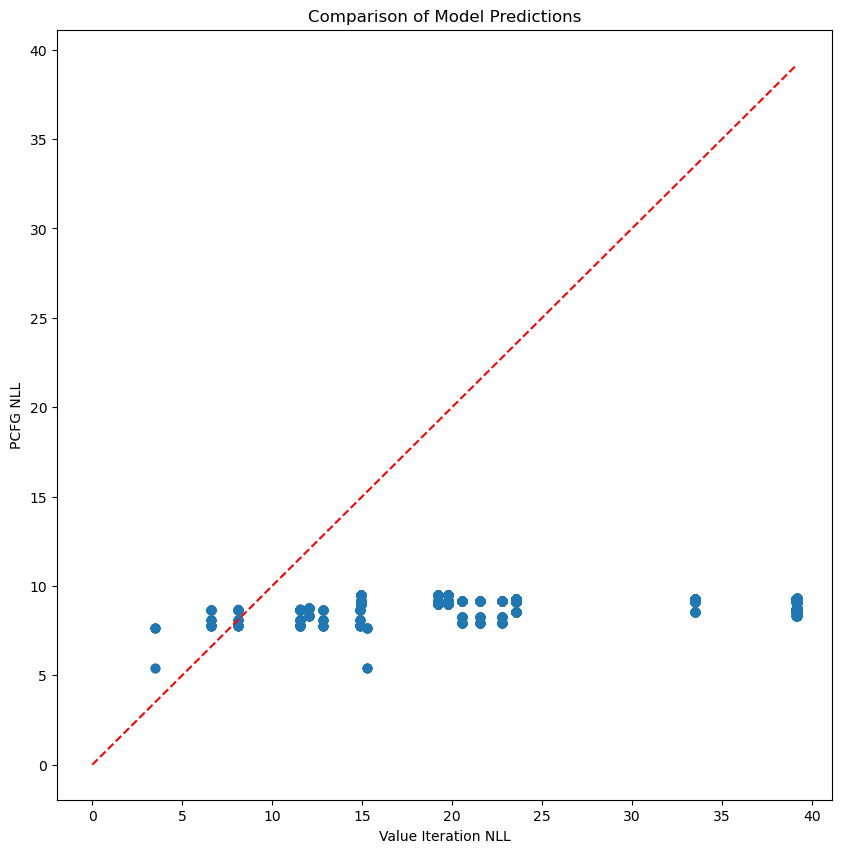

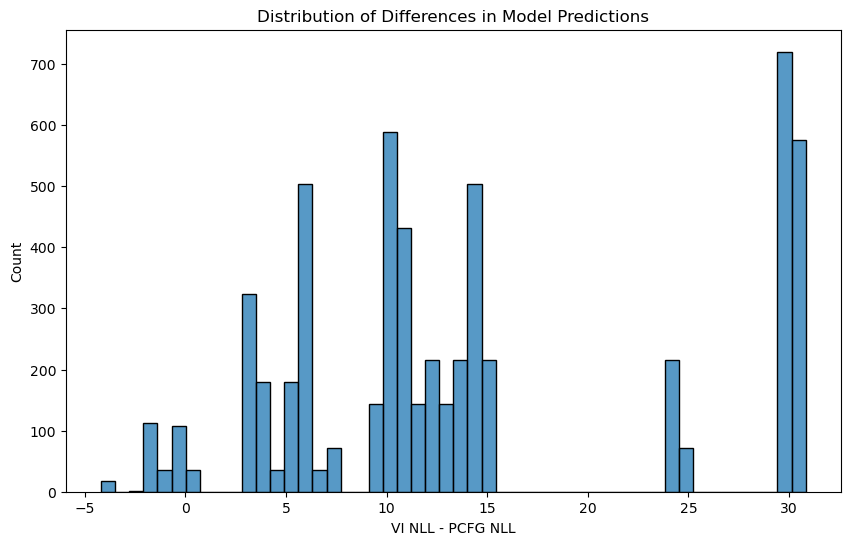


Correlation between model predictions: 0.249

Summary statistics of differences:
count    5832.000000
mean       14.401544
std         9.905704
min        -4.189155
25%         5.952717
50%        11.413062
75%        24.209515
max        30.823292
Name: nll_diff, dtype: float64


In [38]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Merge the dataframes to directly compare NLLs for each state
comparison_df = pd.merge(
    value_iteration_states_nll.rename(columns={'Negative Log Lik': 'VI_NLL'}),
    pcfg_states_nll.rename(columns={'Negative Log Lik': 'PCFG_NLL'}),
    on='state'
)

# 2. Calculate difference in predictions
comparison_df['nll_diff'] = comparison_df['nll_x'] - comparison_df['nll_y']

# 3. Find states with most divergent predictions
most_divergent = comparison_df.nlargest(10, 'nll_diff')
print("States where Value Iteration predicts higher probability than PCFG:")
print(most_divergent[['state', 'nll_x', 'nll_y', 'nll_diff']])

least_divergent = comparison_df.nsmallest(10, 'nll_diff')
print("\nStates where PCFG predicts higher probability than Value Iteration:")
print(least_divergent[['state', 'nll_x', 'nll_y', 'nll_diff']])

# 4. Visualizations
# Scatter plot of NLLs
plt.figure(figsize=(10, 10))
plt.scatter(comparison_df['nll_x'], comparison_df['nll_y'], alpha=0.5)
plt.plot([0, max(comparison_df['nll_x'].max(), comparison_df['nll_y'].max())], 
         [0, max(comparison_df['nll_x'].max(), comparison_df['nll_y'].max())], 
         'r--')  # diagonal line for reference
plt.xlabel('Value Iteration NLL')
plt.ylabel('PCFG NLL')
plt.title('Comparison of Model Predictions')
plt.show()

# Distribution of differences
plt.figure(figsize=(10, 6))
sns.histplot(data=comparison_df, x='nll_diff', bins=50)
plt.title('Distribution of Differences in Model Predictions')
plt.xlabel('VI NLL - PCFG NLL')
plt.show()

# 5. Calculate correlation
correlation = comparison_df['nll_x'].corr(comparison_df['nll_y'])
print(f"\nCorrelation between model predictions: {correlation:.3f}")

# 6. Basic statistics of differences
print("\nSummary statistics of differences:")
print(comparison_df['nll_diff'].describe())

In [24]:
comparison_df

,state,nll_x,nll_y,nll_diff
0,"State(shape1=Shape(sides='circle', shade='medi...",3.460301,7.648896,-4.188595
1,"State(shape1=Shape(sides='circle', shade='medi...",3.460301,7.643964,-4.183662
2,"State(shape1=Shape(sides='triangle', shade='me...",3.460301,7.646240,-4.185938
3,"State(shape1=Shape(sides='square', shade='medi...",3.460301,7.646137,-4.185836
4,"State(shape1=Shape(sides='square', shade='medi...",3.460301,7.639537,-4.179235
...,...,...,...,...
5827,"State(shape1=Shape(sides='triangle', shade='lo...",39.157953,8.747207,30.410745
5828,"State(shape1=Shape(sides='triangle', shade='lo...",39.157953,8.750269,30.407684
5829,"State(shape1=Shape(sides='circle', shade='low'...",39.157953,8.339734,30.818219
5830,"State(shape1=Shape(sides='triangle', shade='hi...",39.157953,8.337638,30.820315


## Plot expected value vs nll for value iteration

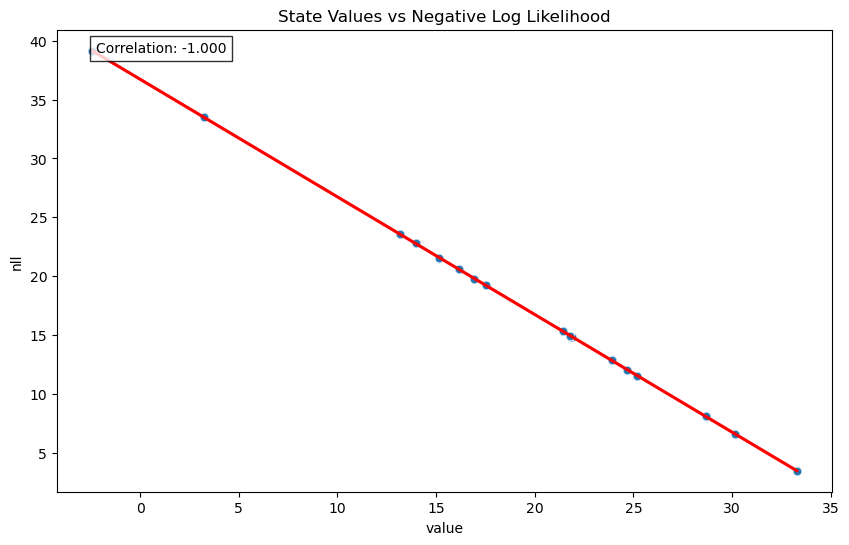


Summary Statistics:
             value          nll
count  5832.000000  5832.000000
mean     13.465853    23.268882
std      10.020611    10.020611
min      -2.423218     3.460301
25%       3.242228    14.941508
50%      16.162158    20.572577
75%      21.793227    33.492507
max      33.274434    39.157953


In [42]:
from collections import namedtuple
from typing import TypeVar, Generic, Hashable
import pandas as pd

# Define Shape and State as namedtuples
Shape = namedtuple('Shape', ['sides', 'shade', 'texture'])
State = namedtuple('State', ['shape1', 'shape2', 'shape3'])

# Then define the TypeVars for generic type hints
StateType = TypeVar('StateType', bound=Hashable)
ActionType = TypeVar('ActionType', bound=Hashable)
Likelihood = TypeVar('Likelihood', float, int)

# Load the value function
with open('goal_value_function.pkl', 'rb') as file:
    value_function = pickle.load(file)

# Create a DataFrame that combines state values and NLLs
value_nll_df = pd.DataFrame({
    'state': value_iteration_states_nll['state'],
    'value': [value_function[eval(state)] for state in value_iteration_states_nll['state']],
    'nll': value_iteration_states_nll['nll']
})

# Create the scatter plot
plt.figure(figsize=(10, 6))
sns.scatterplot(data=value_nll_df, x='value', y='nll', alpha=0.5)
plt.xlabel('State Value')
plt.ylabel('Negative Log Likelihood')
plt.title('State Values vs Negative Log Likelihood')

# Add a trend line
sns.regplot(data=value_nll_df, x='value', y='nll', scatter=False, color='red')

# Calculate correlation
correlation = value_nll_df['value'].corr(value_nll_df['nll'])
plt.text(0.05, 0.95, f'Correlation: {correlation:.3f}', 
         transform=plt.gca().transAxes, 
         bbox=dict(facecolor='white', alpha=0.8))

plt.show()

# Print some summary statistics
print("\nSummary Statistics:")
print(value_nll_df[['value', 'nll']].describe())

In [43]:
# Load the value function
with open('pcfg_state_coverage.pkl', 'rb') as file:
    state_coverage = pickle.load(file)

state_coverage

{State(shape1=Shape(sides='circle', shade='low', texture='striped'), shape2=Shape(sides='circle', shade='low', texture='striped'), shape3=Shape(sides='circle', shade='low', texture='striped')): ['three(same)',
  'two(same,(1,2))',
  'two(same,(0,1))',
  'three(3,same)',
  'two(same,(0,2))',
  'three(low)',
  'three(circle)',
  'three(striped)',
  'two(low,(0,2))',
  'two(striped,(0,2))',
  'two(circle,(1,2))',
  'one(circle,(1))',
  'one(low,(2))',
  'one(circle,(0))',
  'two(striped,(1,2))',
  'one(circle,(2))',
  'one(striped,(0))',
  'two(low,(1,2))',
  'two(low,(0,1))',
  'one(striped,(1))',
  'one(low,(1))',
  'one(low,(0))',
  'two(circle,(0,1))',
  'two(circle,(0,2))',
  'two(striped,(0,1))',
  'one(striped,(2))',
  'and(three(same),three(same))',
  'and(three(circle),three(same))',
  'and(three(3,same),three(same))',
  'and(three(same),three(low))',
  'and(three(same),two(same,(0,2)))',
  'and(three(same),two(same,(1,2)))',
  'and(three(same),three(circle))',
  'and(two(same,(0

## Plot PCFG NLL vs value

In [49]:
comparison_df = pd.merge(
    pcfg_states_nll.rename(columns={'nll': 'PCFG_NLL'}),
    value_nll_df.rename(columns={'nll': 'VI_NLL'}),
    on='state'
)

comparison_df

,state,PCFG_NLL,value,VI_NLL
0,"State(shape1=Shape(sides='square', shade='medi...",5.422851,33.274434,3.460301
1,"State(shape1=Shape(sides='triangle', shade='me...",5.422884,33.274434,3.460301
2,"State(shape1=Shape(sides='triangle', shade='me...",5.422941,33.274434,3.460301
3,"State(shape1=Shape(sides='square', shade='medi...",5.423046,33.274434,3.460301
4,"State(shape1=Shape(sides='circle', shade='medi...",5.425205,33.274434,3.460301
...,...,...,...,...
5827,"State(shape1=Shape(sides='triangle', shade='lo...",9.494979,17.509671,19.225064
5828,"State(shape1=Shape(sides='circle', shade='high...",9.495110,21.793227,14.941508
5829,"State(shape1=Shape(sides='triangle', shade='me...",9.495422,16.937551,19.797184
5830,"State(shape1=Shape(sides='triangle', shade='hi...",9.495897,21.793227,14.941508


<Axes: title={'center': 'State Values vs Negative Log Likelihood (PCFG)'}, xlabel='value', ylabel='PCFG_NLL'>

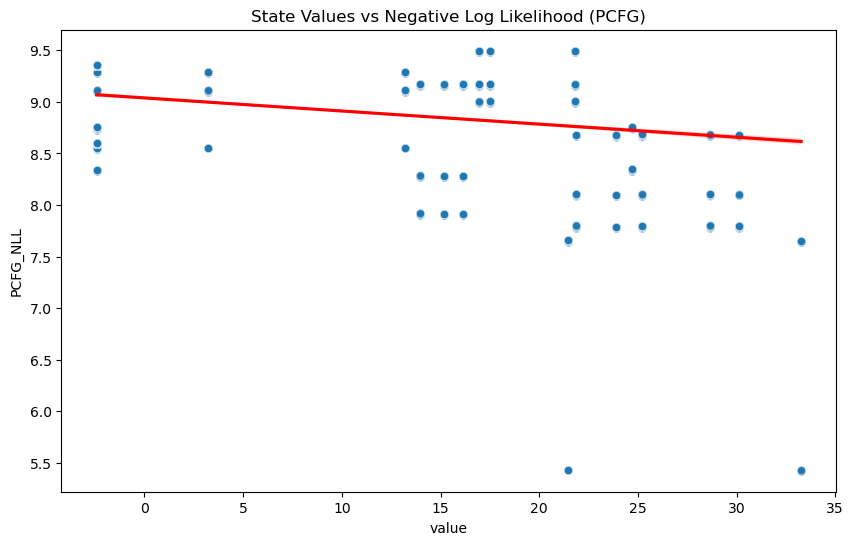

In [52]:
# Create the scatter plot
plt.figure(figsize=(10, 6))
sns.scatterplot(data=comparison_df, x='value', y='PCFG_NLL', alpha=0.5)
plt.xlabel('State Value')
plt.ylabel('Negative Log Likelihood')
plt.title('State Values vs Negative Log Likelihood (PCFG)')

# Add a trend line
sns.regplot(data=comparison_df, x='value', y='PCFG_NLL', scatter=False, color='red')

In [48]:
value_nll_df

,state,value,nll
0,"State(shape1=Shape(sides='circle', shade='medi...",33.274434,3.460301
1,"State(shape1=Shape(sides='circle', shade='medi...",33.274434,3.460301
2,"State(shape1=Shape(sides='triangle', shade='me...",33.274434,3.460301
3,"State(shape1=Shape(sides='square', shade='medi...",33.274434,3.460301
4,"State(shape1=Shape(sides='square', shade='medi...",33.274434,3.460301
...,...,...,...
5827,"State(shape1=Shape(sides='triangle', shade='lo...",-2.423218,39.157953
5828,"State(shape1=Shape(sides='triangle', shade='lo...",-2.423218,39.157953
5829,"State(shape1=Shape(sides='circle', shade='low'...",-2.423218,39.157953
5830,"State(shape1=Shape(sides='triangle', shade='hi...",-2.423218,39.157953


<Axes: title={'center': 'State Values vs Negative Log Likelihood (PCFG)'}, xlabel='PCFG_NLL', ylabel='value'>

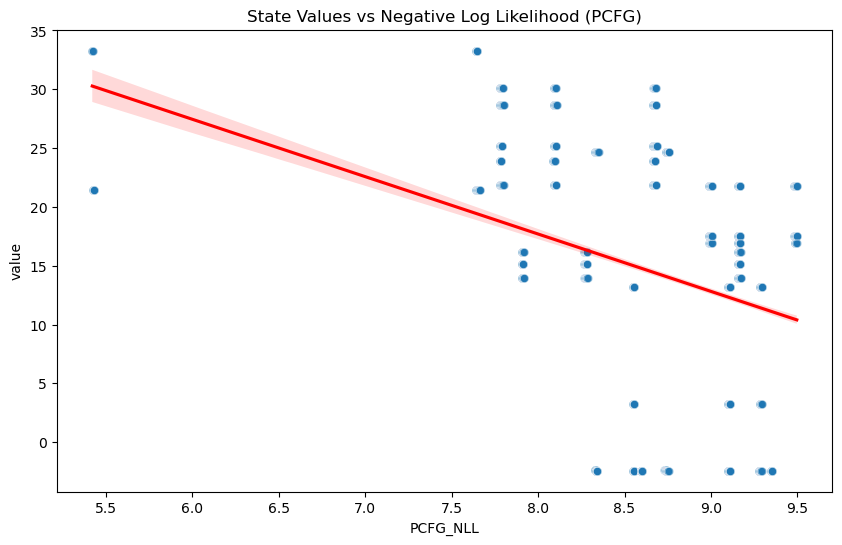

In [53]:
# Create the scatter plot
plt.figure(figsize=(10, 6))
sns.scatterplot(data=comparison_df, x='PCFG_NLL', y='value', alpha=0.5)
plt.xlabel('State Value')
plt.ylabel('Negative Log Likelihood')
plt.title('State Values vs Negative Log Likelihood (PCFG)')

# Add a trend line
sns.regplot(data=comparison_df, x='PCFG_NLL', y='value', scatter=False, color='red')